In [4]:
# Basic libraries
import os
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Deep Learning
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Metrics & Confusion Matrix
from sklearn.metrics import classification_report, confusion_matrix

# Grad-CAM (we'll use later)
from tensorflow.keras.models import Model
import cv2

# For reproducibility
tf.random.set_seed(42)
np.random.seed(42)

# Plot settings
plt.rcParams['figure.figsize'] = (12, 5)
sns.set_style('whitegrid')

print("All libraries imported successfully!")
print(f"TensorFlow version: {tf.__version__}")

All libraries imported successfully!
TensorFlow version: 2.18.0


In [1]:
!python --version

Python 3.11.13


In [3]:
import keras
print("Keras version:", keras.__version__)

Keras version: 3.8.0


In [4]:
import psutil
ram = psutil.virtual_memory()
print(f"Total RAM: {ram.total / 1024**3:.1f} GB")
print(f"Available RAM: {ram.available / 1024**3:.1f} GB")

Total RAM: 31.4 GB
Available RAM: 29.7 GB


In [5]:
import shutil
total, used, free = shutil.disk_usage("/")
print(f"Disk Space: Total: {total // (2**30)} GB, Used: {used // (2**30)} GB, Free: {free // (2**30)} GB")

Disk Space: Total: 8062 GB, Used: 6563 GB, Free: 1499 GB


In [3]:
# In Kaggle, the dataset is mounted under /kaggle/input
base_path = '/kaggle/input/waste-classification-data/DATASET'

train_dir = os.path.join(base_path, 'TRAIN')
test_dir  = os.path.join(base_path, 'TEST')

print("Training directory:", train_dir)
print("Test directory:", test_dir)

# Verify structure
print("\nTraining classes:", os.listdir(train_dir))
print("Test classes:", os.listdir(test_dir))

Training directory: /kaggle/input/waste-classification-data/DATASET/TRAIN
Test directory: /kaggle/input/waste-classification-data/DATASET/TEST

Training classes: ['R', 'O']
Test classes: ['R', 'O']


TRAINING SET: Organic = 12565 | Recyclable = 9999 | Total = 22564
TEST SET:     Organic = 1401 | Recyclable = 1112 | Total = 2513


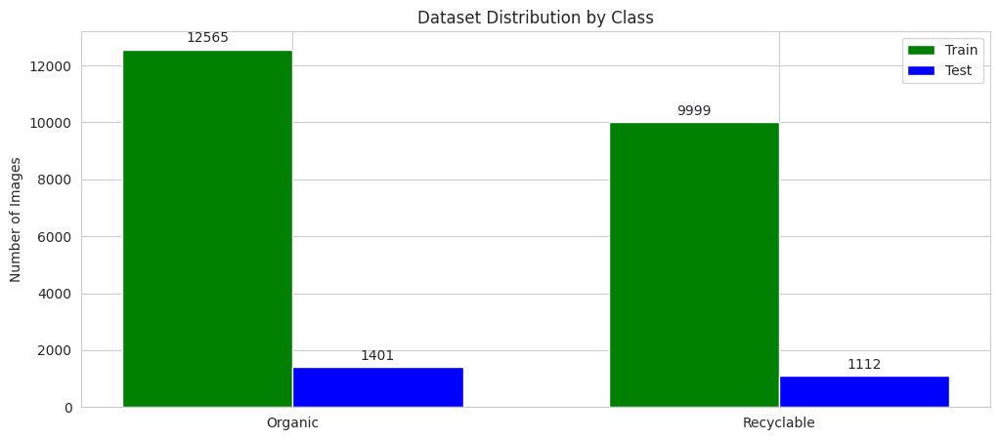

In [4]:
def count_images(directory):
    organic = len(os.listdir(os.path.join(directory, 'O')))
    recyclable = len(os.listdir(os.path.join(directory, 'R')))
    total = organic + recyclable
    return organic, recyclable, total

train_o, train_r, train_total = count_images(train_dir)
test_o, test_r, test_total = count_images(test_dir)

print(f"TRAINING SET: Organic = {train_o} | Recyclable = {train_r} | Total = {train_total}")
print(f"TEST SET:     Organic = {test_o} | Recyclable = {test_r} | Total = {test_total}")

# Visualize distribution
labels = ['Organic', 'Recyclable']
train_counts = [train_o, train_r]
test_counts = [test_o, test_r]

x = np.arange(len(labels))
width = 0.35

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, train_counts, width, label='Train', color='green')
rects2 = ax.bar(x + width/2, test_counts, width, label='Test', color='blue')

ax.set_ylabel('Number of Images')
ax.set_title('Dataset Distribution by Class')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

plt.show()

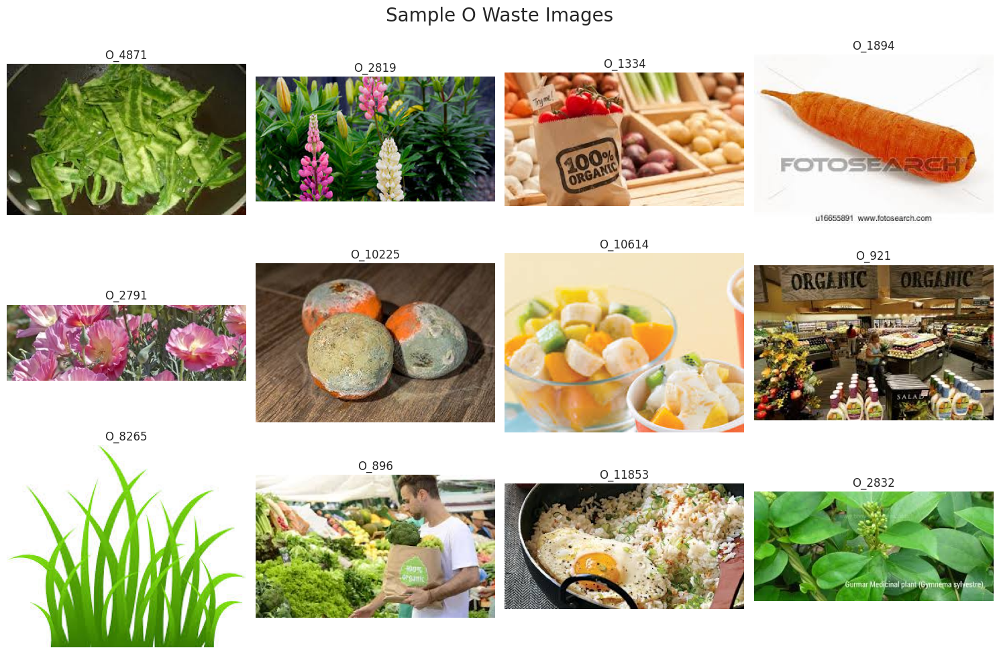

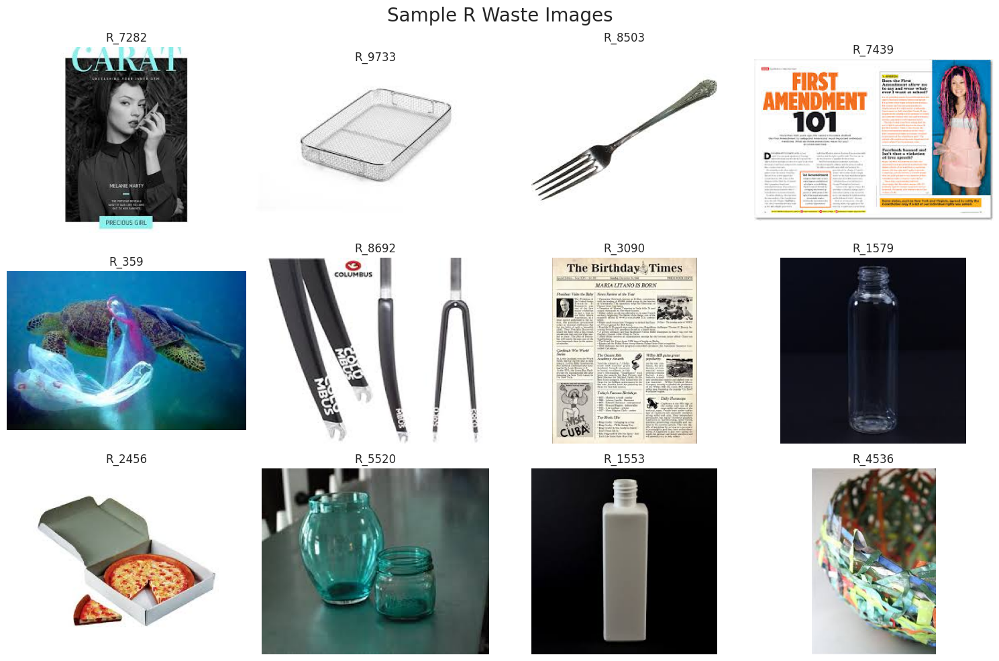

In [5]:
def plot_sample_images(class_name, nrows=3, ncols=4):
    fig, axes = plt.subplots(nrows, ncols, figsize=(15, 10))
    fig.suptitle(f'Sample {class_name} Waste Images', fontsize=20)
    
    path = os.path.join(train_dir, class_name)
    images = os.listdir(path)
    selected = random.sample(images, nrows * ncols)
    
    for i, img_name in enumerate(selected):
        img_path = os.path.join(path, img_name)
        img = load_img(img_path)
        axes[i//ncols, i%ncols].imshow(img)
        axes[i//ncols, i%ncols].set_title(img_name.split('.')[0])  # remove .jpg
        axes[i//ncols, i%ncols].axis('off')
    
    plt.tight_layout()
    plt.show()

# Show Organic samples
plot_sample_images('O')

# Show Recyclable samples
plot_sample_images('R')

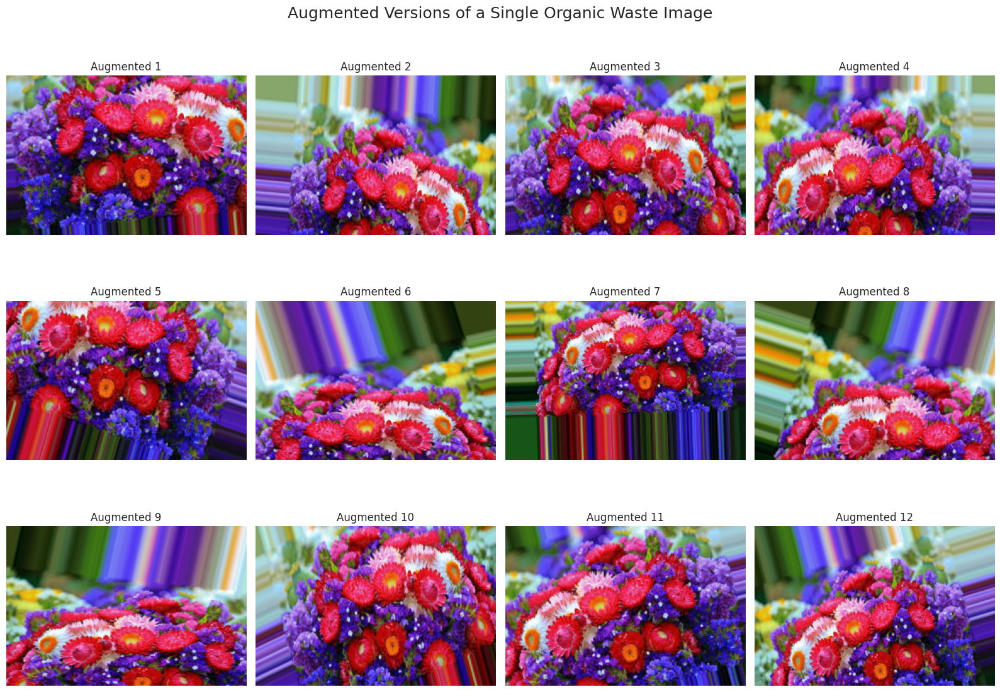

In [6]:
# Data augmentation preview
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Pick one image to augment
sample_img_path = os.path.join(train_dir, 'O', os.listdir(os.path.join(train_dir, 'O'))[0])
img = load_img(sample_img_path)
x = img_to_array(img)
x = x.reshape((1,) + x.shape)

# Generate 12 augmented versions
i = 0
fig, ax = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle('Augmented Versions of a Single Organic Waste Image', fontsize=18)

for batch in datagen.flow(x, batch_size=1):
    ax[i//4, i%4].imshow(batch[0].astype('uint8'))
    ax[i//4, i%4].set_title(f'Augmented {i+1}')
    ax[i//4, i%4].axis('off')
    i += 1
    if i >= 12:
        break

plt.tight_layout()
plt.show()

In [7]:
# Image parameters
IMG_SIZE = 224
BATCH_SIZE = 32

# Training augmentation (strong to handle variety in waste images)
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # 20% of train will be used as validation
)

# Only rescaling for validation and test
val_test_datagen = ImageDataGenerator(rescale=1./255)

# Generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='training',
    seed=42,
    shuffle=True
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    subset='validation',
    seed=42,
    shuffle=True
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='binary',
    shuffle=False  # Important for evaluation
)

print("Class indices:", train_generator.class_indices)  # O -> 0, R -> 1

Found 18052 images belonging to 2 classes.
Found 4512 images belonging to 2 classes.
Found 2513 images belonging to 2 classes.
Class indices: {'O': 0, 'R': 1}


In [8]:
# Custom CNN - simple but effective
model_cnn = Sequential([
    Conv2D(32, (3,3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    BatchNormalization(),
    MaxPooling2D(2,2),
    
    Conv2D(64, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    
    Conv2D(128, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    
    Conv2D(256, (3,3), activation='relu'),
    BatchNormalization(),
    MaxPooling2D(2,2),
    
    Flatten(),
    Dense(512, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')  # Binary classification
])

model_cnn.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

model_cnn.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
I0000 00:00:1763578454.325121      48 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1763578454.325960      48 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 52, 52, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36864)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    18,874,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,265,729 (73.49 MB)

 Trainable params: 19,264,769 (73.49 MB)

 Non-trainable params: 960 (3.75 KB)

In [10]:
# Callbacks
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-7)

# Train
history_cnn = model_cnn.fit(
    train_generator,
    epochs=30,
    validation_data=val_generator,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30


I0000 00:00:1763578487.860063     140 service.cc:148] XLA service 0x7e92e40096a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763578487.861191     140 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1763578487.861213     140 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1763578488.466417     140 cuda_dnn.cc:529] Loaded cuDNN version 90300


  2/565 ━━━━━━━━━━━━━━━━━━━━ 43s 77ms/step - accuracy: 0.5703 - loss: 3.7736   

I0000 00:00:1763578495.068936     140 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


565/565 ━━━━━━━━━━━━━━━━━━━━ 521s 905ms/step - accuracy: 0.7262 - loss: 4.3013 - val_accuracy: 0.7886 - val_loss: 0.4820 - learning_rate: 0.0010
Epoch 2/30
565/565 ━━━━━━━━━━━━━━━━━━━━ 299s 530ms/step - accuracy: 0.8158 - loss: 0.4493 - val_accuracy: 0.8081 - val_loss: 0.4294 - learning_rate: 0.0010
Epoch 3/30
565/565 ━━━━━━━━━━━━━━━━━━━━ 265s 470ms/step - accuracy: 0.8127 - loss: 0.4631 - val_accuracy: 0.8285 - val_loss: 0.4264 - learning_rate: 0.0010
Epoch 4/30
565/565 ━━━━━━━━━━━━━━━━━━━━ 263s 465ms/step - accuracy: 0.8235 - loss: 0.4358 - val_accuracy: 0.8260 - val_loss: 0.4262 - learning_rate: 0.0010
Epoch 5/30
565/565 ━━━━━━━━━━━━━━━━━━━━ 273s 483ms/step - accuracy: 0.8195 - loss: 0.4438 - val_accuracy: 0.8149 - val_loss: 0.3909 - learning_rate: 0.0010
Epoch 6/30
565/565 ━━━━━━━━━━━━━━━━━━━━ 249s 440ms/step - accuracy: 0.8243 - loss: 0.4305 - val_accuracy: 0.8008 - val_loss: 0.4548 - learning_rate: 0.0010
Epoch 7/30
565/565 ━━━━━━━━━━━━━━━━━━━━ 247s 438ms/step - accuracy: 0.8368 

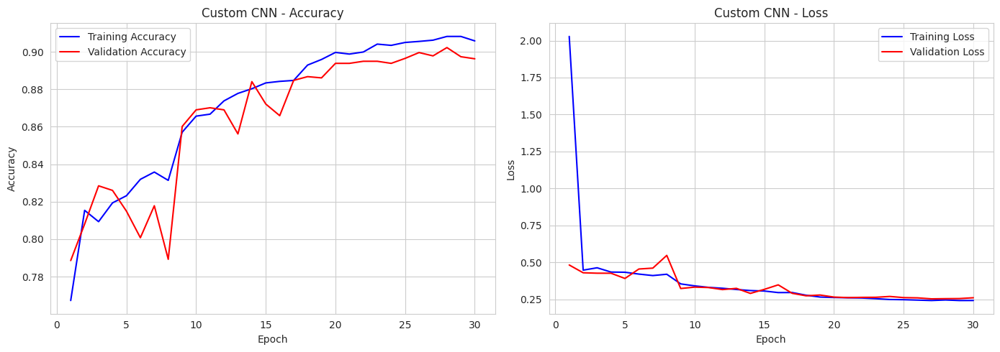

In [11]:
def plot_history(history, title):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    
    plt.figure(figsize=(14, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'b-', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'r-', label='Validation Accuracy')
    plt.title(f'{title} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'b-', label='Training Loss')
    plt.plot(epochs, val_loss, 'r-', label='Validation Loss')
    plt.title(f'{title} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

plot_history(history_cnn, "Custom CNN")

79/79 ━━━━━━━━━━━━━━━━━━━━ 57s 718ms/step


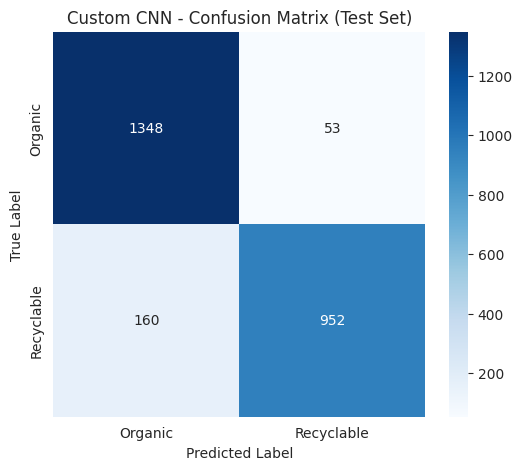

Custom CNN - Test Performance
              precision    recall  f1-score   support

     Organic       0.89      0.96      0.93      1401
  Recyclable       0.95      0.86      0.90      1112

    accuracy                           0.92      2513
   macro avg       0.92      0.91      0.91      2513
weighted avg       0.92      0.92      0.91      2513



In [12]:
# Predictions
y_pred = (model_cnn.predict(test_generator) > 0.5).astype(int)
y_true = test_generator.classes

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Organic', 'Recyclable'],
            yticklabels=['Organic', 'Recyclable'])
plt.title('Custom CNN - Confusion Matrix (Test Set)')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

# Classification Report
print("Custom CNN - Test Performance")
print(classification_report(y_true, y_pred, target_names=['Organic', 'Recyclable']))

In [13]:
# Save the full model (recommended way - can be loaded with tf.keras.models.load_model)
model_cnn.save('/kaggle/working/custom_cnn_waste_classifier.h5')
print("Custom CNN saved as: custom_cnn_waste_classifier.h5")

# Also save in the newer Keras format (optional, but very reliable)
model_cnn.save('/kaggle/working/custom_cnn_waste_classifier.keras')
print("Custom CNN also saved in .keras format")

Custom CNN saved as: custom_cnn_waste_classifier.h5
Custom CNN also saved in .keras format


In [7]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model

# Load MobileNetV2 without top layers
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the base model (we'll fine-tune only the top layers first)
base_model.trainable = False

# Add custom head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(1, activation='sigmoid')(x)

model_mobilenet = Model(inputs=base_model.input, outputs=predictions)

model_mobilenet.compile(optimizer=Adam(learning_rate=0.0001),
                        loss='binary_crossentropy',
                        metrics=['accuracy'])

print("MobileNetV2 model ready!")
model_mobilenet.summary()

I0000 00:00:1763654790.068378      48 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1763654790.069090      48 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
MobileNetV2 model ready!


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,259,265 (8.62 MB)

 Trainable params: 1,281 (5.00 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [8]:
# Same callbacks as before
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-7)

# Train (should converge much faster and higher than custom CNN)
history_mobilenet = model_mobilenet.fit(
    train_generator,
    epochs=20,                  # Usually converges in <15 epochs
    validation_data=val_generator,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/20


I0000 00:00:1763654869.257423     133 service.cc:148] XLA service 0x7ad5500041f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763654869.258236     133 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1763654869.258256     133 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1763654870.212409     133 cuda_dnn.cc:529] Loaded cuDNN version 90300


  1/565 ━━━━━━━━━━━━━━━━━━━━ 1:32:04 10s/step - accuracy: 0.5938 - loss: 0.6681

I0000 00:00:1763654874.358506     133 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


565/565 ━━━━━━━━━━━━━━━━━━━━ 324s 557ms/step - accuracy: 0.6487 - loss: 0.6609 - val_accuracy: 0.8819 - val_loss: 0.3448 - learning_rate: 1.0000e-04
Epoch 2/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 235s 416ms/step - accuracy: 0.8164 - loss: 0.4172 - val_accuracy: 0.9056 - val_loss: 0.2666 - learning_rate: 1.0000e-04
Epoch 3/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 237s 420ms/step - accuracy: 0.8488 - loss: 0.3456 - val_accuracy: 0.9162 - val_loss: 0.2367 - learning_rate: 1.0000e-04
Epoch 4/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 235s 415ms/step - accuracy: 0.8657 - loss: 0.3194 - val_accuracy: 0.9193 - val_loss: 0.2170 - learning_rate: 1.0000e-04
Epoch 5/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 234s 414ms/step - accuracy: 0.8784 - loss: 0.2966 - val_accuracy: 0.9271 - val_loss: 0.2126 - learning_rate: 1.0000e-04
Epoch 6/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 234s 414ms/step - accuracy: 0.8840 - loss: 0.2853 - val_accuracy: 0.9282 - val_loss: 0.2010 - learning_rate: 1.0000e-04
Epoch 7/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 234s 414ms/

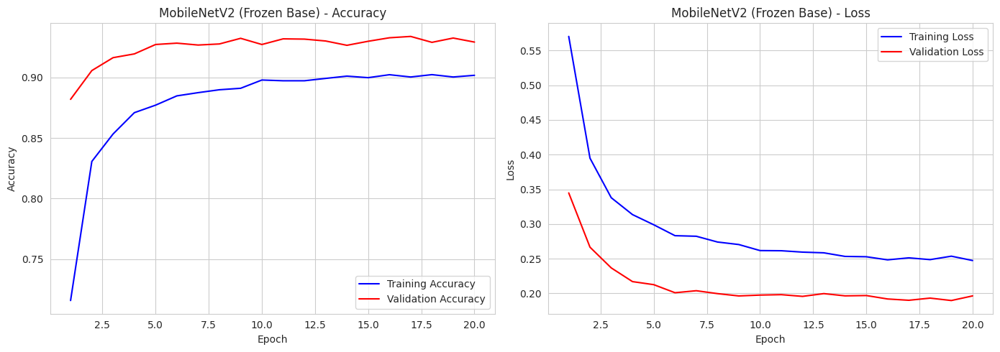

In [9]:
def plot_history(history, title):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(acc) + 1)
    
    plt.figure(figsize=(14, 5))
    
    plt.subplot(1, 2, 1)
    plt.plot(epochs, acc, 'b-', label='Training Accuracy')
    plt.plot(epochs, val_acc, 'r-', label='Validation Accuracy')
    plt.title(f'{title} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    
    plt.subplot(1, 2, 2)
    plt.plot(epochs, loss, 'b-', label='Training Loss')
    plt.plot(epochs, val_loss, 'r-', label='Validation Loss')
    plt.title(f'{title} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    
    plt.tight_layout()
    plt.show()

# Plot curves
plot_history(history_mobilenet, "MobileNetV2 (Frozen Base)")

79/79 ━━━━━━━━━━━━━━━━━━━━ 22s 248ms/step
MobileNetV2 - Test Accuracy: 0.8559


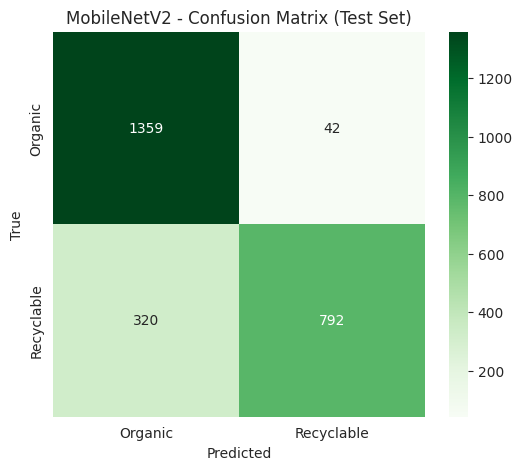

MobileNetV2 - Detailed Report
              precision    recall  f1-score   support

     Organic       0.81      0.97      0.88      1401
  Recyclable       0.95      0.71      0.81      1112

    accuracy                           0.86      2513
   macro avg       0.88      0.84      0.85      2513
weighted avg       0.87      0.86      0.85      2513



In [10]:
# Evaluate on test set
y_pred_mb = (model_mobilenet.predict(test_generator) > 0.5).astype(int)
y_true = test_generator.classes

print("MobileNetV2 - Test Accuracy: {:.4f}".format(np.mean(y_pred_mb.flatten() == y_true)))

# Confusion Matrix
cm_mb = confusion_matrix(y_true, y_pred_mb)
plt.figure(figsize=(6,5))
sns.heatmap(cm_mb, annot=True, fmt='d', cmap='Greens',
            xticklabels=['Organic', 'Recyclable'],
            yticklabels=['Organic', 'Recyclable'])
plt.title('MobileNetV2 - Confusion Matrix (Test Set)')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()

# Classification Report
print("MobileNetV2 - Detailed Report")
print(classification_report(y_true, y_pred_mb, target_names=['Organic', 'Recyclable']))

In [11]:
# Unfreeze the last 30 layers for fine-tuning
base_model.trainable = True
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Recompile with lower learning rate
model_mobilenet.compile(optimizer=Adam(learning_rate=1e-5),
                        loss='binary_crossentropy',
                        metrics=['accuracy'])

# Fine-tune
history_fine = model_mobilenet.fit(
    train_generator,
    epochs=10,
    validation_data=val_generator,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

Epoch 1/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 256s 429ms/step - accuracy: 0.8874 - loss: 0.2848 - val_accuracy: 0.9145 - val_loss: 0.2164 - learning_rate: 1.0000e-05
Epoch 2/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 234s 414ms/step - accuracy: 0.9042 - loss: 0.2452 - val_accuracy: 0.9269 - val_loss: 0.1927 - learning_rate: 1.0000e-05
Epoch 3/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 234s 414ms/step - accuracy: 0.9150 - loss: 0.2100 - val_accuracy: 0.9291 - val_loss: 0.1970 - learning_rate: 1.0000e-05
Epoch 4/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 235s 416ms/step - accuracy: 0.9218 - loss: 0.2042 - val_accuracy: 0.9313 - val_loss: 0.1876 - learning_rate: 1.0000e-05
Epoch 5/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 235s 416ms/step - accuracy: 0.9299 - loss: 0.1858 - val_accuracy: 0.9371 - val_loss: 0.1685 - learning_rate: 1.0000e-05
Epoch 6/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 235s 415ms/step - accuracy: 0.9288 - loss: 0.1838 - val_accuracy: 0.9344 - val_loss: 0.1738 - learning_rate: 1.0000e-05
Epoch 7/10
565/565 ━━━━━━━━━━━━━━━━━━━━ 

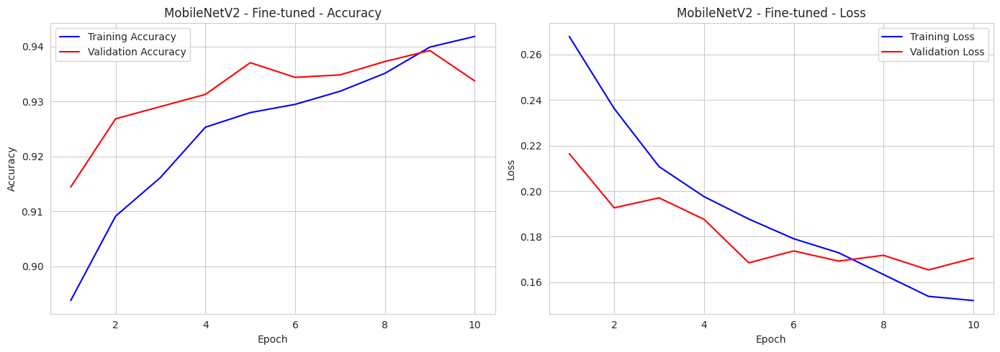

In [12]:
# Re-evaluate
plot_history(history_fine, "MobileNetV2 - Fine-tuned")

79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 47ms/step
MobileNetV2 - Test Accuracy: 0.8850


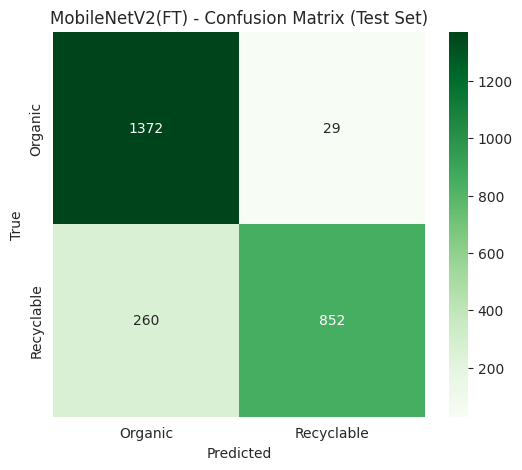

MobileNetV2 - Detailed Report
              precision    recall  f1-score   support

     Organic       0.84      0.98      0.90      1401
  Recyclable       0.97      0.77      0.85      1112

    accuracy                           0.88      2513
   macro avg       0.90      0.87      0.88      2513
weighted avg       0.90      0.88      0.88      2513



In [14]:
# Evaluate on test set
y_pred_mb = (model_mobilenet.predict(test_generator) > 0.5).astype(int)
y_true = test_generator.classes

print("MobileNetV2 - Test Accuracy: {:.4f}".format(np.mean(y_pred_mb.flatten() == y_true)))

# Confusion Matrix
cm_mb = confusion_matrix(y_true, y_pred_mb)
plt.figure(figsize=(6,5))
sns.heatmap(cm_mb, annot=True, fmt='d', cmap='Greens',
            xticklabels=['Organic', 'Recyclable'],
            yticklabels=['Organic', 'Recyclable'])
plt.title('MobileNetV2(FT) - Confusion Matrix (Test Set)')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()

# Classification Report
print("MobileNetV2 - Detailed Report")
print(classification_report(y_true, y_pred_mb, target_names=['Organic', 'Recyclable']))

In [16]:
from tensorflow.keras.applications import EfficientNetB3
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout
from tensorflow.keras.models import Model

# Load EfficientNetB3
base_model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze base first
base_model.trainable = False

# Build model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
predictions = Dense(1, activation='sigmoid')(x)

model_effnet = Model(inputs=base_model.input, outputs=predictions)

model_effnet.compile(optimizer=Adam(learning_rate=0.0003),
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

print("EfficientNetB3 ready!")
model_effnet.summary()

43941136/43941136 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
EfficientNetB3 ready!


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │      1,080 │ stem_conv_pad[0]… │
│                     │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        160 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        360 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        160 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 40)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 40)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 40)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 10)  │        410 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 40)  │        440 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 40)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │        960 │ block1a_se_excit

 Total params: 10,785,072 (41.14 MB)

 Trainable params: 1,537 (6.00 KB)

 Non-trainable params: 10,783,535 (41.14 MB)

Epoch 1/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 314s 499ms/step - accuracy: 0.5465 - loss: 0.6918 - val_accuracy: 0.5895 - val_loss: 0.6767 - learning_rate: 3.0000e-04
Epoch 2/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 243s 430ms/step - accuracy: 0.5650 - loss: 0.6847 - val_accuracy: 0.5900 - val_loss: 0.6746 - learning_rate: 3.0000e-04
Epoch 3/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 240s 425ms/step - accuracy: 0.5765 - loss: 0.6812 - val_accuracy: 0.5929 - val_loss: 0.6708 - learning_rate: 3.0000e-04
Epoch 4/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 243s 430ms/step - accuracy: 0.5754 - loss: 0.6809 - val_accuracy: 0.5858 - val_loss: 0.6689 - learning_rate: 3.0000e-04
Epoch 5/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 257s 455ms/step - accuracy: 0.5775 - loss: 0.6767 - val_accuracy: 0.5924 - val_loss: 0.6677 - learning_rate: 3.0000e-04
Epoch 6/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 240s 424ms/step - accuracy: 0.5896 - loss: 0.6769 - val_accuracy: 0.5922 - val_loss: 0.6685 - learning_rate: 3.0000e-04
Epoch 7/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 

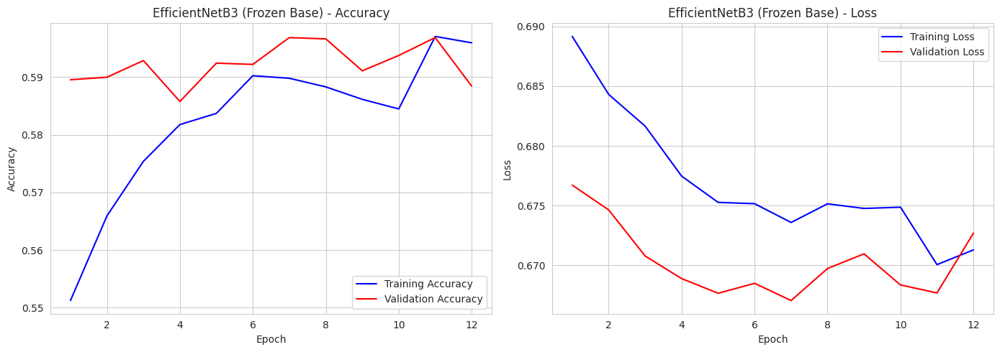

In [17]:
# Train with frozen base (fast, usually reaches 96–97% quickly)
history_effnet = model_effnet.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

plot_history(history_effnet, "EfficientNetB3 (Frozen Base)")

79/79 ━━━━━━━━━━━━━━━━━━━━ 25s 214ms/step
EfficientNetB3 Test Accuracy: 0.7012


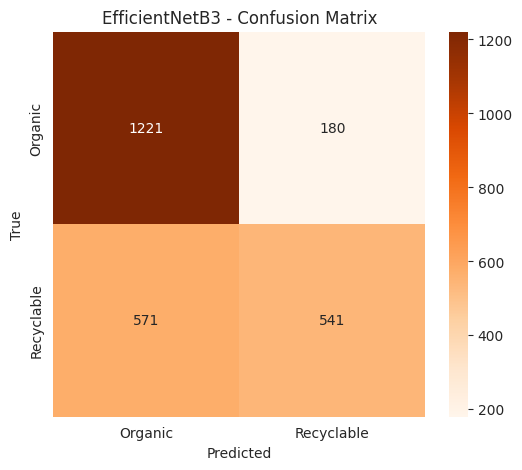

EfficientNetB3 - Classification Report
              precision    recall  f1-score   support

     Organic       0.68      0.87      0.76      1401
  Recyclable       0.75      0.49      0.59      1112

    accuracy                           0.70      2513
   macro avg       0.72      0.68      0.68      2513
weighted avg       0.71      0.70      0.69      2513



In [18]:
# Evaluate
y_pred_eff = (model_effnet.predict(test_generator) > 0.5).astype(int)
y_true = test_generator.classes

test_acc_eff = np.mean(y_pred_eff.flatten() == y_true)
print(f"EfficientNetB3 Test Accuracy: {test_acc_eff:.4f}")

# Confusion Matrix
cm_eff = confusion_matrix(y_true, y_pred_eff)
plt.figure(figsize=(6,5))
sns.heatmap(cm_eff, annot=True, fmt='d', cmap='Oranges',
            xticklabels=['Organic', 'Recyclable'],
            yticklabels=['Organic', 'Recyclable'])
plt.title('EfficientNetB3 - Confusion Matrix')
plt.ylabel('True')
plt.xlabel('Predicted')
plt.show()

print("EfficientNetB3 - Classification Report")
print(classification_report(y_true, y_pred_eff, target_names=['Organic', 'Recyclable']))

In [19]:
from tensorflow.keras.applications import ResNet50V2

# Load ResNet50V2
base_model = ResNet50V2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze base
base_model.trainable = False

# Build model
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)
x = Dense(1, activation='sigmoid')(x)

model_resnet = Model(inputs=base_model.input, outputs=x)

model_resnet.compile(optimizer=Adam(learning_rate=0.0003),
                     loss='binary_crossentropy',
                     metrics=['accuracy'])

print("ResNet50V2 ready!")
model_resnet.summary()

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step
ResNet50V2 ready!


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 56, 56,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 56, 56,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 58, 58,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 56, 56,    │          0 │ conv2_block1_0_c

 Total params: 23,566,849 (89.90 MB)

 Trainable params: 2,049 (8.00 KB)

 Non-trainable params: 23,564,800 (89.89 MB)

Epoch 1/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 279s 469ms/step - accuracy: 0.7430 - loss: 0.5408 - val_accuracy: 0.9391 - val_loss: 0.1730 - learning_rate: 3.0000e-04
Epoch 2/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 245s 434ms/step - accuracy: 0.8898 - loss: 0.2802 - val_accuracy: 0.9379 - val_loss: 0.1687 - learning_rate: 3.0000e-04
Epoch 3/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 242s 429ms/step - accuracy: 0.9030 - loss: 0.2469 - val_accuracy: 0.9382 - val_loss: 0.1713 - learning_rate: 3.0000e-04
Epoch 4/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 241s 426ms/step - accuracy: 0.9106 - loss: 0.2378 - val_accuracy: 0.9342 - val_loss: 0.1660 - learning_rate: 3.0000e-04
Epoch 5/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 241s 427ms/step - accuracy: 0.9119 - loss: 0.2287 - val_accuracy: 0.9353 - val_loss: 0.1772 - learning_rate: 3.0000e-04
Epoch 6/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 240s 425ms/step - accuracy: 0.9161 - loss: 0.2207 - val_accuracy: 0.9313 - val_loss: 0.1770 - learning_rate: 3.0000e-04
Epoch 7/20
565/565 ━━━━━━━━━━━━━━━━━━━━ 

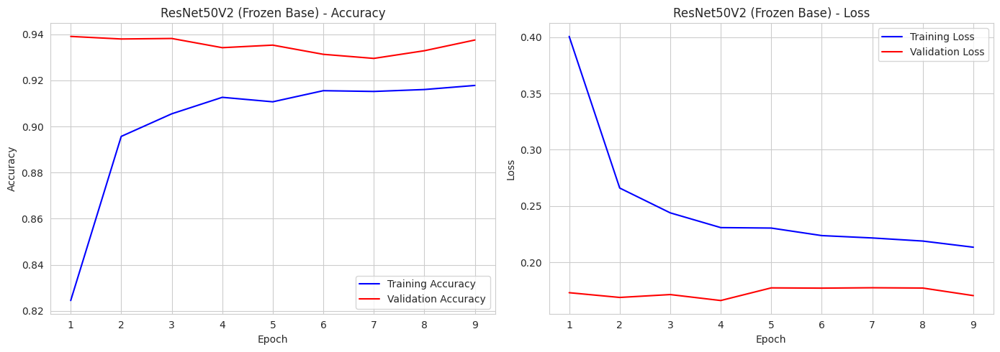

In [20]:
# Train (usually converges in 10–15 epochs)
history_resnet = model_resnet.fit(
    train_generator,
    epochs=20,
    validation_data=val_generator,
    callbacks=[early_stop, reduce_lr],
    verbose=1
)

plot_history(history_resnet, "ResNet50V2 (Frozen Base)")

79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step
ResNet50V2 Test Accuracy: 0.8914


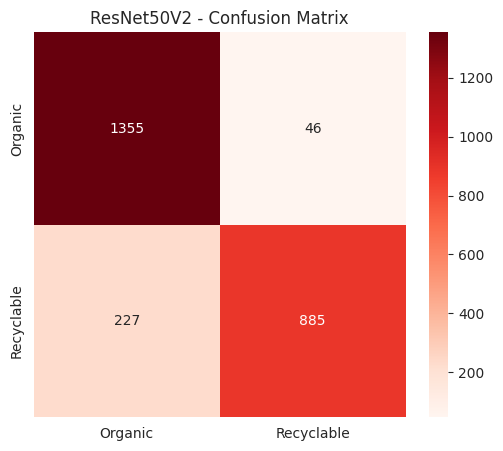

              precision    recall  f1-score   support

     Organic       0.86      0.97      0.91      1401
  Recyclable       0.95      0.80      0.87      1112

    accuracy                           0.89      2513
   macro avg       0.90      0.88      0.89      2513
weighted avg       0.90      0.89      0.89      2513



In [21]:
# Quick test evaluation
y_pred_res = (model_resnet.predict(test_generator) > 0.5).astype(int)
y_true = test_generator.classes

resnet_acc = np.mean(y_pred_res.flatten() == y_true)
print(f"ResNet50V2 Test Accuracy: {resnet_acc:.4f}")

# Confusion matrix
cm_res = confusion_matrix(y_true, y_pred_res)
plt.figure(figsize=(6,5))
sns.heatmap(cm_res, annot=True, fmt='d', cmap='Reds',
            xticklabels=['Organic', 'Recyclable'],
            yticklabels=['Organic', 'Recyclable'])
plt.title('ResNet50V2 - Confusion Matrix')
plt.show()

print(classification_report(y_true, y_pred_res, target_names=['Organic', 'Recyclable']))

In [22]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Data from your classification reports
data = {
    'Model': [
        'Custom CNN',
        'MobileNetV2',
        'MobileNetV2 (F.T.)',
        'EfficientNetB3',
        'ResNet50V2'
    ],
    'Accuracy': [0.92, 0.86, 0.88, 0.70, 0.89],
    
    # Organic (class 0)
    'Precision_Organic': [0.89, 0.81, 0.84, 0.68, 0.86],
    'Recall_Organic':    [0.96, 0.97, 0.98, 0.87, 0.97],
    'F1_Organic':        [0.93, 0.88, 0.90, 0.76, 0.91],
    
    # Recyclable (class 1)
    'Precision_Recyclable': [0.95, 0.95, 0.97, 0.75, 0.95],
    'Recall_Recyclable':    [0.86, 0.71, 0.77, 0.49, 0.80],
    'F1_Recyclable':        [0.90, 0.81, 0.85, 0.59, 0.87],
    
    # Macro avg F1
    'Macro_F1': [0.91, 0.85, 0.88, 0.68, 0.89]
}

df = pd.DataFrame(data)

# Sort by Accuracy descending (Custom CNN on top)
df = df.sort_values('Accuracy', ascending=False).reset_index(drop=True)

print(df[['Model', 'Accuracy', 'Macro_F1']])

                Model  Accuracy  Macro_F1
0          Custom CNN      0.92      0.91
1          ResNet50V2      0.89      0.89
2  MobileNetV2 (F.T.)      0.88      0.88
3         MobileNetV2      0.86      0.85
4      EfficientNetB3      0.70      0.68


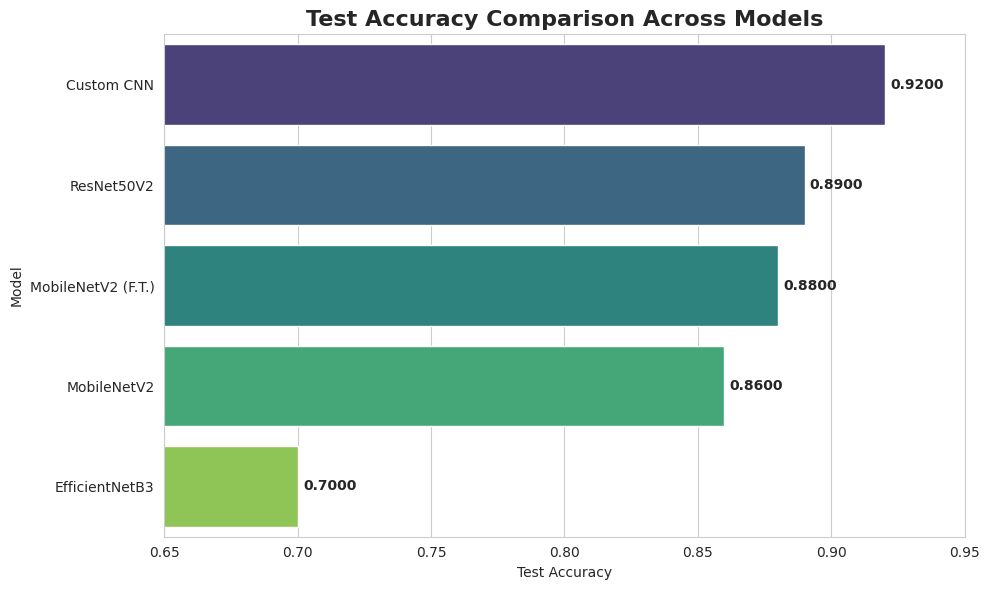

In [23]:
# Plot 1: Test Accuracy Comparison
plt.figure(figsize=(10, 6))
sns.barplot(x='Accuracy', y='Model', data=df, palette='viridis')

plt.title('Test Accuracy Comparison Across Models', fontsize=16, fontweight='bold')
plt.xlabel('Test Accuracy')
plt.xlim(0.65, 0.95)

for i, acc in enumerate(df['Accuracy']):
    plt.text(acc + 0.002, i, f'{acc:.4f}', va='center', fontweight='bold')

plt.tight_layout()
plt.show()

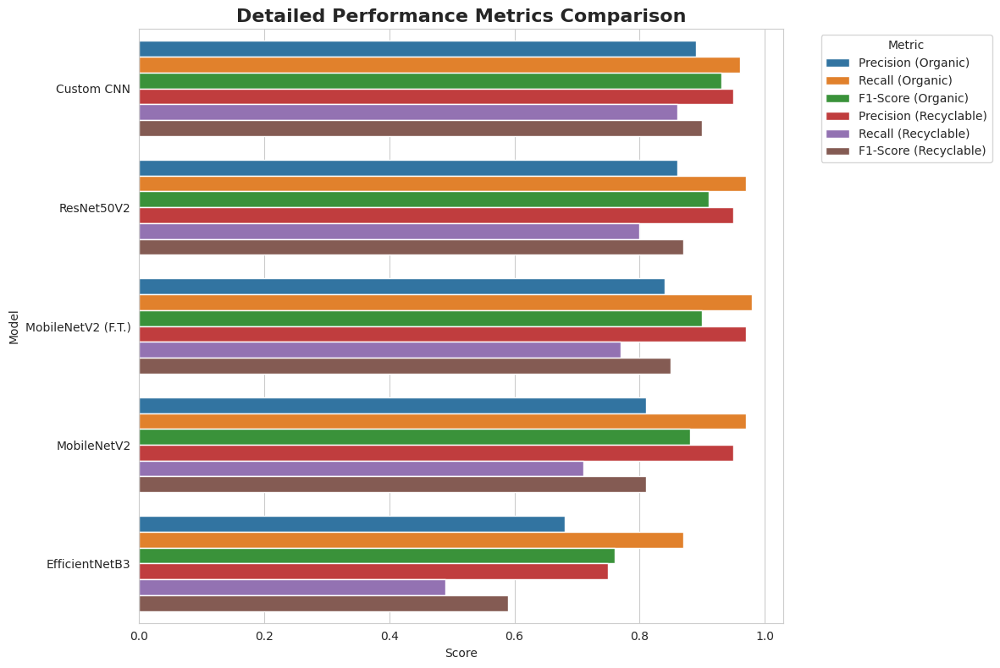

In [24]:
# Plot 2: Detailed Metrics Comparison (Precision, Recall, F1 per class)
metrics_df = pd.melt(df, 
                     id_vars='Model', 
                     value_vars=['Precision_Organic', 'Recall_Organic', 'F1_Organic',
                                 'Precision_Recyclable', 'Recall_Recyclable', 'F1_Recyclable'],
                     var_name='Metric', 
                     value_name='Score')

# Clean metric names
metrics_df['Metric'] = metrics_df['Metric'].replace({
    'Precision_Organic': 'Precision (Organic)',
    'Recall_Organic': 'Recall (Organic)',
    'F1_Organic': 'F1-Score (Organic)',
    'Precision_Recyclable': 'Precision (Recyclable)',
    'Recall_Recyclable': 'Recall (Recyclable)',
    'F1_Recyclable': 'F1-Score (Recyclable)'
})

plt.figure(figsize=(12, 8))
sns.barplot(y='Model', x='Score', hue='Metric', data=metrics_df, palette='tab10')

plt.title('Detailed Performance Metrics Comparison', fontsize=16, fontweight='bold')
plt.xlabel('Score')
plt.legend(title='Metric', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [25]:
# Optional: Macro F1 + Accuracy in one compact table (perfect for report)
summary = df[['Model', 'Accuracy', 'Macro_F1']].round(4)
summary.columns = ['Model', 'Test Accuracy', 'Macro F1-Score']
summary.style.highlight_max(color='lightgreen', subset=['Test Accuracy', 'Macro F1-Score'])

,Model,Test Accuracy,Macro F1-Score
0,Custom CNN,0.920000,0.910000
1,ResNet50V2,0.890000,0.890000
2,MobileNetV2 (F.T.),0.880000,0.880000
3,MobileNetV2,0.860000,0.850000
4,EfficientNetB3,0.700000,0.680000


In [2]:
# Cell 1: Load your model + test generator + predictions (run only once)
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.metrics import confusion_matrix
import seaborn as sns

# UPDATE THIS PATH TO YOUR UPLOADED MODEL
model_path = '/kaggle/input/waste-classification/keras/default/1/custom_cnn_waste_classifier.h5'  # or .h5
model = load_model(model_path)
print("✅ Custom CNN loaded successfully!")

✅ Custom CNN loaded successfully!


In [5]:
model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='binary_crossentropy',
                  metrics=['accuracy'])

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 222, 222, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 109, 109, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 52, 52, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 24, 24, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 24, 24, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 12, 12, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 36864)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    18,874,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           513 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 19,265,729 (73.49 MB)

 Trainable params: 19,264,769 (73.49 MB)

 Non-trainable params: 960 (3.75 KB)


Testing: O_12823.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


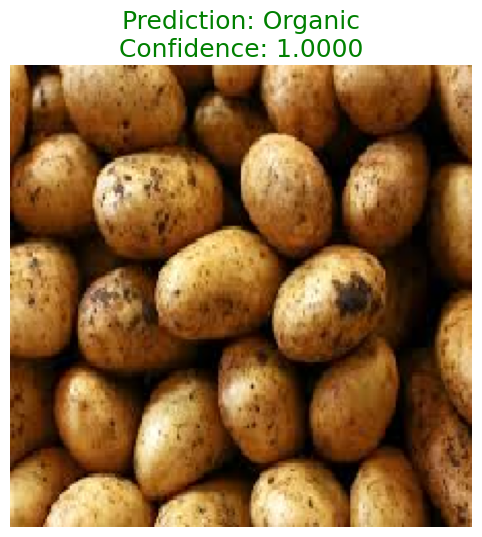

Predicted: Organic | Confidence: 1.0000

Testing: O_12568.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


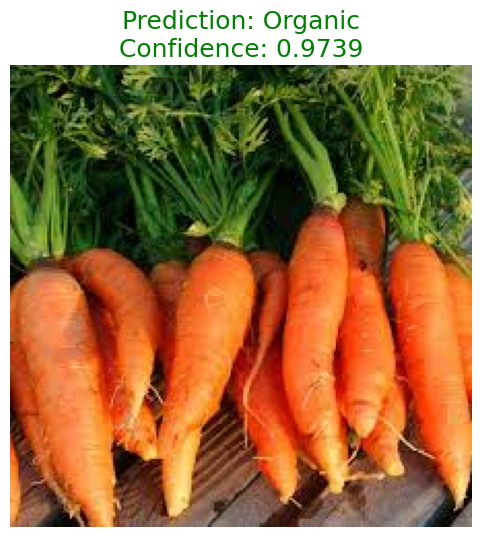

Predicted: Organic | Confidence: 0.9739

Testing: R_10005.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


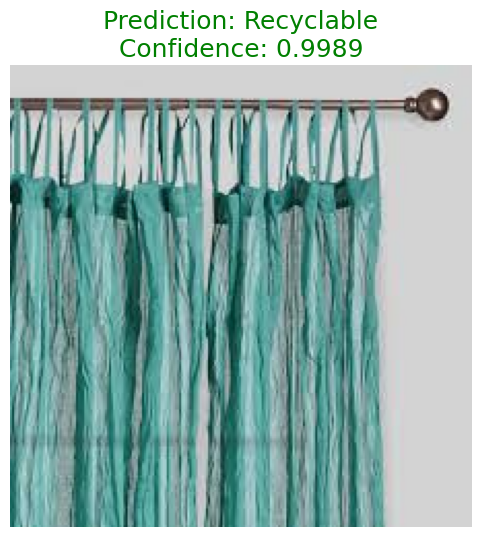

Predicted: Recyclable | Confidence: 0.9989

Testing: R_10458.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


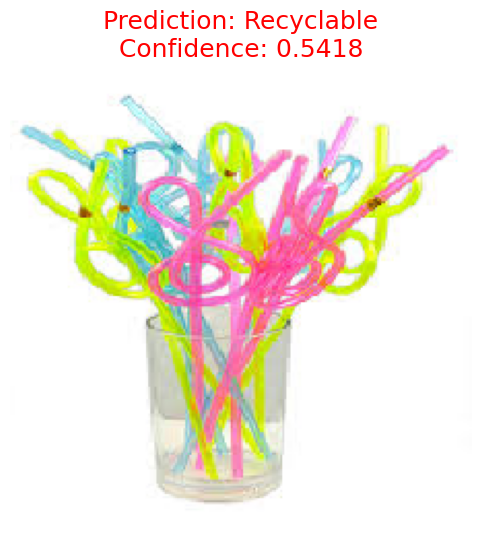

Predicted: Recyclable | Confidence: 0.5418

Testing: R_10470.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


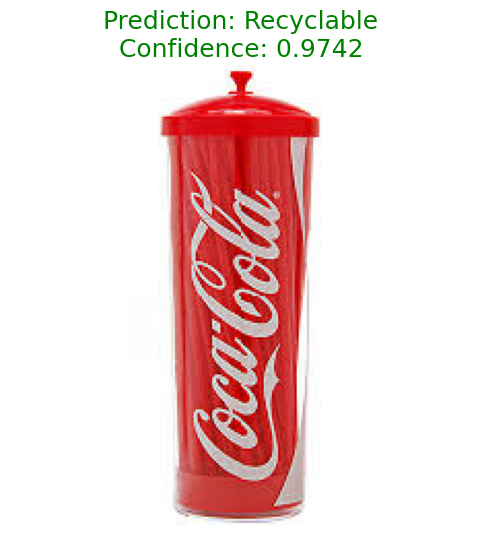

Predicted: Recyclable | Confidence: 0.9742

Testing: O_13222.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


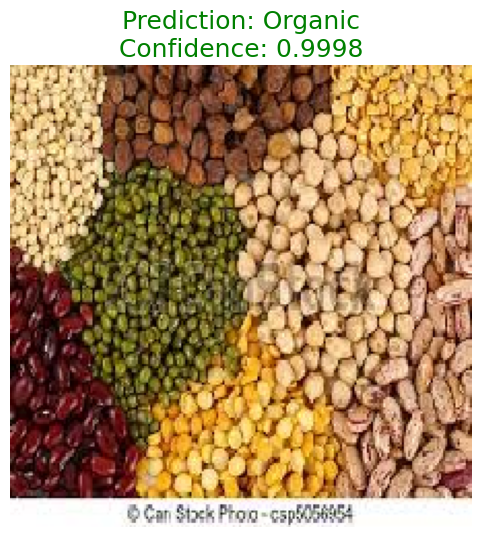

Predicted: Organic | Confidence: 0.9998


In [9]:
# Class names
class_names = ['Organic', 'Recyclable']

# --------------------- LIVE PREDICTION FUNCTION ---------------------
def predict_waste_image(image_path):
    # Load and preprocess image
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize
    
    # Predict
    prediction = model.predict(img_array)[0][0]
    
    # Determine class and confidence
    if prediction < 0.5:
        predicted_class = class_names[0]
        confidence = 1 - prediction
    else:
        predicted_class = class_names[1]
        confidence = prediction
    
    # Display result
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(f'Prediction: {predicted_class}\nConfidence: {confidence:.4f}', 
              fontsize=18, color='green' if confidence > 0.8 else 'red')
    plt.axis('off')
    plt.show()
    
    print(f"Predicted: {predicted_class} | Confidence: {confidence:.4f}")
    
    return predicted_class, confidence

# --------------------- TEST ON YOUR IMAGES ---------------------
# Example: replace with your uploaded image paths
test_image_paths = [
    '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_12823.jpg',
    '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_12568.jpg',
    '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_10005.jpg',
    '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_10458.jpg',
    '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_10470.jpg',
    '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_13222.jpg',
]

# Run predictions
for path in test_image_paths:
    if os.path.exists(path):
        print(f"\nTesting: {os.path.basename(path)}")
        predict_waste_image(path)
    else:
        print(f"Image not found: {path}")

In [8]:
!pip list | grep lime

lime                                     0.2.0.1


/usr/local/lib/python3.11/dist-packages/keras/src/saving/saving_lib.py:757: UserWarning: Skipping variable loading for optimizer 'rmsprop', because it has 22 variables whereas the saved optimizer has 42 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Model loaded!

Interpreting: R_10009.jpg


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 426ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━

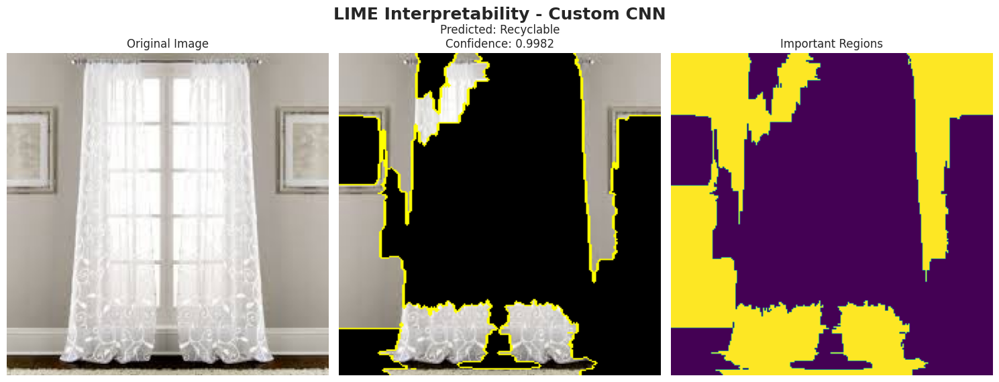

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import os

# Load your model (update path)
model = load_model('/kaggle/input/custom-cnn/keras/default/1/custom_cnn_waste_classifier.keras')
print("Model loaded!")

class_names = ['Organic', 'Recyclable']

def explain_with_lime(image_path, num_samples=1000, num_features=8):
    # Load and preprocess
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img) / 255.0
    img_array_batch = np.expand_dims(img_array, axis=0)
    
    # Predict once
    pred = model.predict(img_array_batch, verbose=0)[0][0]
    predicted_idx = 1 if pred > 0.5 else 0
    predicted_class = class_names[predicted_idx]
    confidence = pred if predicted_idx == 1 else 1 - pred
    
    # LIME explainer
    explainer = lime_image.LimeImageExplainer()
    
    # Explain — this generates explanations for top classes
    explanation = explainer.explain_instance(
        image=img_array,
        classifier_fn=model.predict,
        top_labels=2,
        hide_color=0,
        num_samples=num_samples
    )
    
    # Use the TOP predicted label (always exists!)
    top_label = explanation.top_labels[0]
    
    # Get image + mask for the top predicted class
    temp, mask = explanation.get_image_and_mask(
        label=top_label,
        positive_only=True,
        num_features=num_features,
        hide_rest=True
    )
    
    # Plot
    plt.figure(figsize=(15, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(mark_boundaries(temp, mask))
    plt.title(f"\nPredicted: {predicted_class}\nConfidence: {confidence:.4f}")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(mask, cmap='viridis')
    plt.title("Important Regions")
    plt.axis('off')
    
    plt.suptitle("LIME Interpretability - Custom CNN", fontsize=18, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Test on your images
test_images = [
    '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_10009.jpg'
]

for path in test_images:
    if os.path.exists(path):
        print(f"\nInterpreting: {os.path.basename(path)}")
        explain_with_lime(path, num_samples=800)  # 800 is faster, still good quality
    else:
        print(f"Not found: {path}")


Interpreting: R_10779.jpg


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━

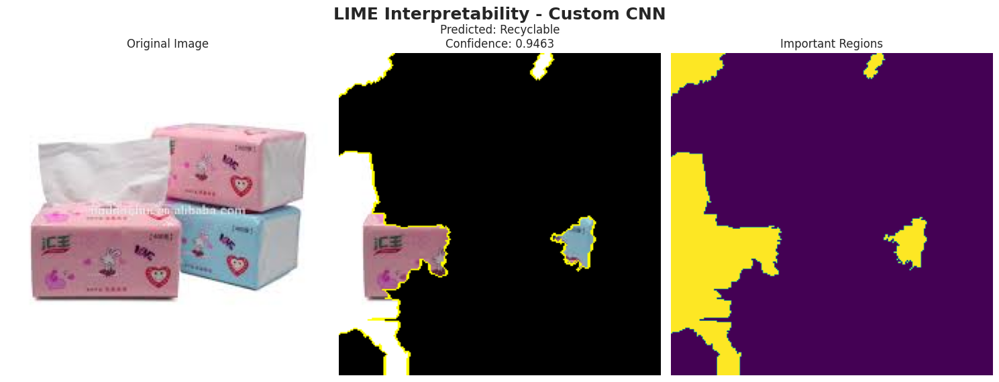

In [28]:
# Test on your images
test_images = [
    '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_10779.jpg'
]

for path in test_images:
    if os.path.exists(path):
        print(f"\nInterpreting: {os.path.basename(path)}")
        explain_with_lime(path, num_samples=800)  # 800 is faster, still good quality
    else:
        print(f"Not found: {path}")


Interpreting: R_11111.jpg


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━

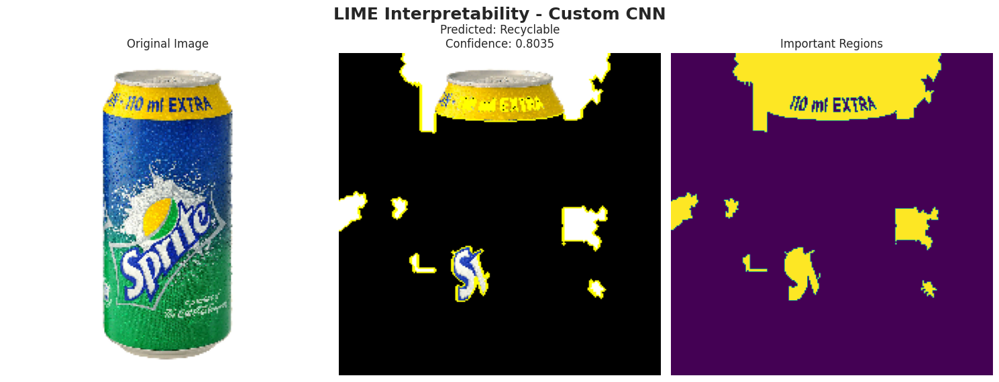

In [33]:
# Test on your images
test_images = [
    '/kaggle/input/waste-classification-data/DATASET/TEST/R/R_11111.jpg'
]

for path in test_images:
    if os.path.exists(path):
        print(f"\nInterpreting: {os.path.basename(path)}")
        explain_with_lime(path, num_samples=800)  # 800 is faster, still good quality
    else:
        print(f"Not found: {path}")


Interpreting: O_12590.jpg


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

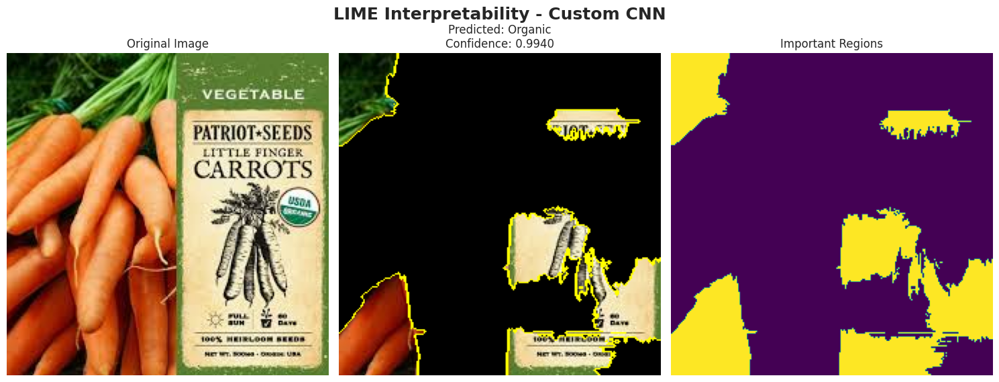

In [14]:
# Test on your images
test_images = [
    '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_12590.jpg'
]

for path in test_images:
    if os.path.exists(path):
        print(f"\nInterpreting: {os.path.basename(path)}")
        explain_with_lime(path, num_samples=800)  # 800 is faster, still good quality
    else:
        print(f"Not found: {path}")


Interpreting: O_12568.jpg


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━

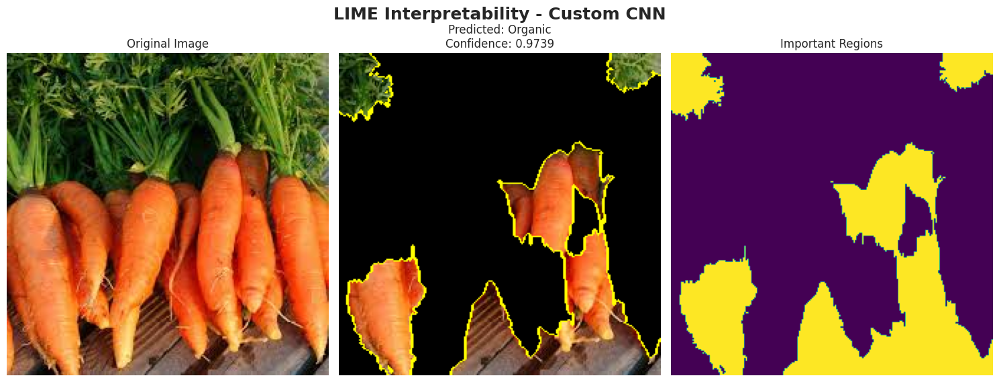

In [24]:
# Test on your images
test_images = [
    '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_12568.jpg'
]

for path in test_images:
    if os.path.exists(path):
        print(f"\nInterpreting: {os.path.basename(path)}")
        explain_with_lime(path, num_samples=800)  # 800 is faster, still good quality
    else:
        print(f"Not found: {path}")


Interpreting: O_12864.jpg


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

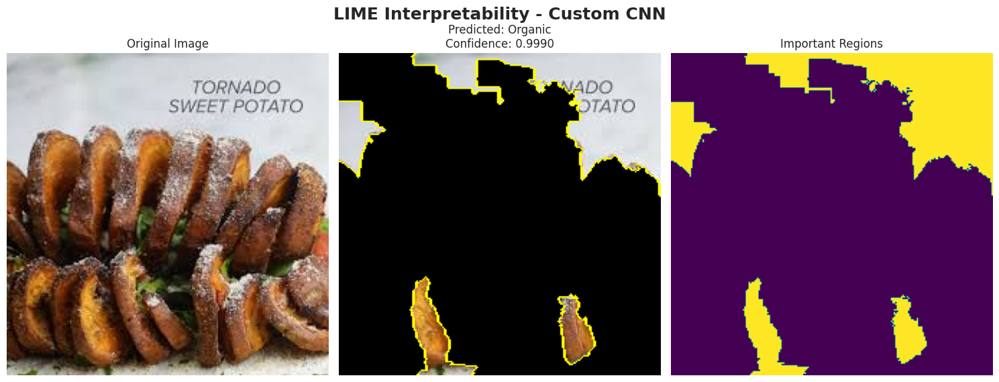

In [25]:
# Test on your images
test_images = [
    '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_12864.jpg'
]

for path in test_images:
    if os.path.exists(path):
        print(f"\nInterpreting: {os.path.basename(path)}")
        explain_with_lime(path, num_samples=800)  # 800 is faster, still good quality
    else:
        print(f"Not found: {path}")


Interpreting: O_13076.jpg


  0%|          | 0/800 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━

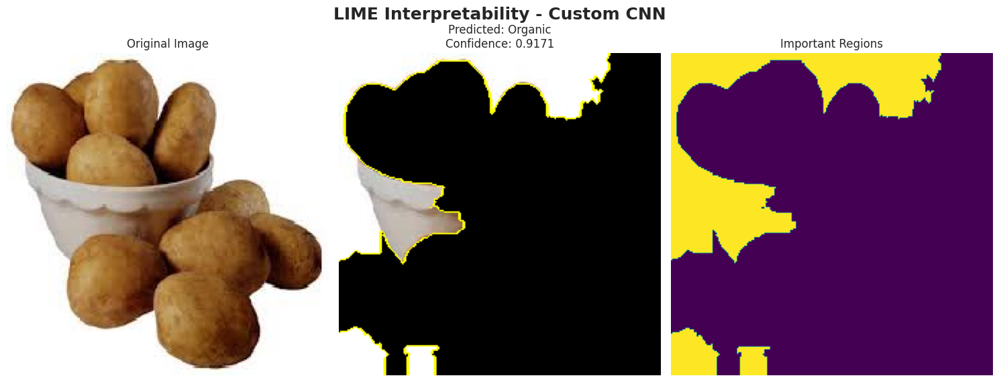

In [29]:
# Test on your images
test_images = [
    '/kaggle/input/waste-classification-data/DATASET/TEST/O/O_13076.jpg'
]

for path in test_images:
    if os.path.exists(path):
        print(f"\nInterpreting: {os.path.basename(path)}")
        explain_with_lime(path, num_samples=800)  # 800 is faster, still good quality
    else:
        print(f"Not found: {path}")